In [2]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings("ignore")

In [3]:
# to read the data i.e. csv file
df=pd.read_csv('telecom-churn.csv')
df

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,AZ,192,415,414-4276,no,yes,36,156.2,77,26.55,...,126,18.32,279.1,83,12.56,9.9,6,2.67,2,False
3329,WV,68,415,370-3271,no,no,0,231.1,57,39.29,...,55,13.04,191.3,123,8.61,9.6,4,2.59,3,False
3330,RI,28,510,328-8230,no,no,0,180.8,109,30.74,...,58,24.55,191.9,91,8.64,14.1,6,3.81,2,False
3331,CT,184,510,364-6381,yes,no,0,213.8,105,36.35,...,84,13.57,139.2,137,6.26,5.0,10,1.35,2,False


Churn rate of telecom operators clients

In [4]:
# to get the shape of data 
df.shape

(3333, 21)

In [5]:
# to get all the columns names
df.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'total day charge',
       'total eve minutes', 'total eve calls', 'total eve charge',
       'total night minutes', 'total night calls', 'total night charge',
       'total intl minutes', 'total intl calls', 'total intl charge',
       'customer service calls', 'churn'],
      dtype='object')

In [6]:
# to get the size of the data
df.size

69993

In [7]:
# To get the informtion of the dataframe columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [8]:
# To change the data type of the column
df['churn']=df["churn"].astype('int64')
df['churn']

0       0
1       0
2       0
3       0
4       0
       ..
3328    0
3329    0
3330    0
3331    0
3332    0
Name: churn, Length: 3333, dtype: int64

In [9]:
# to get all the statistics functions
df.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856,0.144914
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491,0.352067
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000,0.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000,0.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000,0.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000,1.000000


In [10]:
df.describe(include=['object','bool'])

,state,phone number,international plan,voice mail plan
count,3333,3333,3333,3333
unique,51,3333,2,2
top,WV,382-4657,no,no
freq,106,1,3010,2411


In [11]:
# counts number of 0's and 1's in the churn column where we have changed its data type
df['churn'].value_counts()

churn
0    2850
1     483
Name: count, dtype: int64

In [12]:
# to sort the va;ues by total day charge in ascending or decending order
df.sort_values(by="total day charge",ascending=False).head(10)

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
365,CO,154,415,343-5709,no,no,0,350.8,75,59.64,...,94,18.40,253.9,100,11.43,10.1,9,2.73,1,1
985,NY,64,415,345-9140,yes,no,0,346.8,55,58.96,...,79,21.21,275.4,102,12.39,13.3,9,3.59,1,1
2594,OH,115,510,348-1163,yes,no,0,345.3,81,58.70,...,106,17.29,217.5,107,9.79,11.8,8,3.19,1,1
156,OH,83,415,370-9116,no,no,0,337.4,120,57.36,...,116,19.33,153.9,114,6.93,15.8,7,4.27,0,1
605,MO,112,415,373-2053,no,no,0,335.5,77,57.04,...,109,18.06,265.0,132,11.93,12.7,8,3.43,2,1
975,DE,129,510,332-6181,no,no,0,334.3,118,56.83,...,104,16.33,191.0,83,8.59,10.4,6,2.81,0,1
15,NY,161,415,351-7269,no,no,0,332.9,67,56.59,...,97,27.01,160.6,128,7.23,5.4,9,1.46,4,1
1679,OK,82,510,393-4823,no,no,0,329.8,73,56.07,...,120,17.71,267.1,102,12.02,10.6,6,2.86,0,1
2028,SD,93,510,408-4836,no,no,0,328.1,106,55.78,...,89,12.89,303.5,114,13.66,8.7,3,2.35,1,1
197,TX,208,510,378-3625,no,no,0,326.5,67,55.51,...,113,14.99,181.7,102,8.18,10.7,6,2.89,2,1


In [13]:
# to get mean of of the churn
df["churn"].mean()

0.14491449144914492

In [14]:
# What are average value of numeric features for churned users?
df[df["churn"]==1].mean()

TypeError: Could not convert ['INNYCOAZMDIDWYCOTXDCNYTXINNJLAMSIDMENVMSMSVTOHAKTXMEFLMDMDMNNVVAORKSSDOKCTFLRIVTINMNSDMTALGAFLMSCOCOCAMOWIORDCDEDEDEKSOHOHMANVFLWVALMEMEMIMOMSALSCMNWIVTAKGAMTNCWVINSDOKMAMONVKSNJGAMOCAMTTXWVUTWYUTKYPAWIMANJNVVAKYCOSCNEMAALMALAMECTMDWVARMOKYNVNJNJNMDEGAVTNYKSMIWYUTVACANYMENJNJOHMINENVWYUTGAKSMDMDNMILCOKSTNMNMAFLMTMINYNCORUTWATXWADETNIDKSWYWAMASDPAWAVTCTSCOHOKMTMSMIILMEUTDEMDARMTUTOHIADECAWYORMEWVMINJKSARMTNHAZMDMNCTMDALNVOKORPAVTMAORFLWVMOAZTXNVNJDCMENYNCCTNMMNORDENYCTNHWASCNCPANCMONMMAOHMITXMSKYCTNEOKSDWIINVTNJWANHWAPAHIMDAZTXNDNYKYSCRITNTXSDOKNJTXKSORNHMANHGAMNLANJCATXCAVAMTNESCALFLNVNCKSNMWAPAUTTXMSMINVNETNMSARNVLAUTNYMNTNILMTFLWINYNVNDNJCTMISCSCMDNYNYIDTXWIDCCAMNCOMNPACANCWVINIDRIKYMDNJCORICTORSCKYMNWVMSNYNDOHALDEOKARNHNDMINHKSSCNJVANMRIMSNDIASCMNMNMISCMIWVNJNJNCTXPAMDILWINJMEMDMNARMTSDIDWYORALMSSCNHMAWYMIUTCTMSMTNVWANYINDCOKGANDOHWYNCTXKYORCTMIMTHIKSNYMIVTWATXMTMEMNSCCOMDTXWVSDARHIIAMTNCNHWAMEARARTXIDWAIDCTMSOHINMEWAAKARNCOKRIIDWAMDARKSMICAILGAMDIN'
 '329-6603351-7269393-7984360-1596383-6029398-1294353-3759370-7574374-8042374-5353360-1171395-3026402-1251358-9095334-1275355-6291362-9748363-1069355-6837335-4858414-8718390-2390370-9116372-3750378-3625353-7292366-6345375-1476360-3324374-9107338-1027335-1697380-2558386-4170339-3049352-6976387-5860416-1676329-7347419-1714336-3819366-7912413-9269387-5453380-3437343-6940420-7823402-1942341-4463343-5709357-1909374-7787405-5305328-6011402-5155332-5521352-4418361-6563365-5979385-8997405-6189418-6737352-8327334-9505418-6651375-2975376-8573343-1965366-7247405-3916397-9148411-7778394-8402416-2778418-6455378-3508364-7719419-8987339-7541344-3160419-1674353-6007420-9838345-1524386-2810373-2053380-7742383-1657348-8015372-6497411-5958416-8701405-4920384-2372420-9971327-3587353-8363398-3834330-7754383-4061339-6637371-9457393-7826397-6789364-9040341-1191409-4447335-1874410-6791367-8168374-9203366-3358395-6195346-7656370-5527370-2688418-9036402-3892355-2464368-7555399-9802332-5949408-4529370-9755332-6181413-5190394-7447345-9140369-8024387-9137408-6326329-2786400-6257338-6962344-7197333-7631332-5084401-8735368-1288390-7930362-5111350-7306338-6018385-8184368-5437409-4734346-5068358-4576352-5118343-7019334-8694369-5449356-8449390-9811351-7005364-7644357-9136373-1448413-2241375-4107377-1293394-4520419-1863395-9215399-3083415-8448382-5401411-4714379-8681346-1629374-9576387-7371392-2555403-9167357-6039414-1496339-1330399-6233405-3097413-4040366-5829412-2520393-6840380-4080390-9627398-8745413-7743400-7002343-5219344-3466403-8916337-7167377-1273380-7816402-6744400-2181366-1613384-8723341-7686371-2500366-2273405-1108387-2604417-4810368-7706337-8618405-2276372-7990406-9926384-3299395-7923377-4169393-4823348-5725365-2008380-8727374-1981333-5101384-5004348-7193418-7055404-3106341-8719334-5029330-4978355-3801376-9607421-8537407-7258335-6508348-6720390-5055331-1391420-6465348-6853409-7523397-1766373-8908369-7017420-8435342-4122340-1876383-6095407-2259417-3999379-1720405-7676361-2349387-5533359-4336406-3069334-6519405-4109357-5696405-5403330-9354335-2019384-5632352-6068371-1727382-4932377-5043401-7359375-2184403-9719364-9904373-8483399-7268403-2673340-4972417-4826339-6477340-8323408-4836374-8329367-8692335-4888379-7215400-8375400-8538419-5171413-2194355-2634422-5350381-4029335-2967388-6026346-2020329-9067411-2958385-7148387-1535336-8343359-5731367-1681351-4025329-9667418-5300327-8495416-5660365-7774367-3220406-2242413-7468379-2503364-3286420-8897351-7309401-6982328-7833342-8167348-4316375-3826356-5475371-6284410-7611340-6908399-2457358-2490349-3112391-1737352-5466364-5510416-6886344-1136378-6276343-2592396-4410347-3406352-7752388-9285333-4594388-2240373-4264354-5689328-8980399-2151379-9524350-7114353-9998409-9911379-6970332-6139415-4564414-7090332-2889412-1991372-8883330-2635408-3262410-3159344-5181384-7236408-5322409-2983378-9542344-1970333-9002329-6731395-1901348-1163337-4600354-7397397-3746332-5820357-1938409-4671376-5213402-3370382-8079373-6922347-8659382-2182369-6890420-6324383-9306369-1929359-7426415-6347390-9735343-2689359-6232388-7540389-4608328-9797418-8568405-3309384-4938355-9366343-1347376-4292352-5787415-3537373-3959358-1346401-9665399-5291409-6588330-5824403-6187358-3692391-2159406-4100347-2016388-8948363-8033328-9267376-4705366-1084348-4660397-6542404-4809361-7283372-4868406-7844406-2866333-5729391-1499369-3626358-7165328-5188378-1936380-4374387-1116384-3413396-4254333-3010353-3372360-2329385-1118408-8269413-9328335-7144406-8995341-9890344-1362345-3947379-5885342-1004405-5513348-5728345-4589349-3005411-2977417-4456421-1326359-3423385-7157385-4766389-8417341-4873394-5489393-8762366-8939385-5688416-3649337-1586415-5476332-2650345-6961346-5992402-3908345-3787369-8574370-9622351-2815378-1884384-6132338-6714334-6129377-4975411-6823408-1913367-5226373-7974345-3614404-5840335-7324417-1488330-7137411-5677409-1856362-5899'
 'nonononoyesnonononononononononononoyesnononoyesnononoyesyesnoyesnoyesnonoyesnonononononononoyesnonononoyesyesnoyesyesnononononoyesnonononoyesnonoyesyesyesyesnonoyesnoyesyesyesnononoyesnonononoyesnoyesyesyesnonononoyesyesnononoyesyesyesyesnoyesyesnoyesnonoyesnononononononononoyesnononononononoyesyesnonoyesnonononononononononoyesnonononoyesyesyesnononononononononononononononoyesnononoyesyesnonoyesnonononononononoyesyesnonoyesyesyesnonononoyesnoyesnoyesnononoyesyesnononononoyesyesyesyesnononononononononoyesnononononoyesyesnonoyesnoyesnoyesyesnonoyesnonononoyesyesnonononononoyesnoyesnonoyesnononononoyesnononononoyesyesnononoyesnonononoyesnonoyesnononoyesyesnoyesnonononoyesyesyesyesnonoyesnonononononoyesnonononononoyesyesyesnononononononoyesnonononoyesnonoyesnononoyesnononononoyesnoyesnononoyesnononoyesnononononononoyesnonoyesnoyesyesnonoyesnonoyesyesyesyesnononoyesnononononononoyesyesnonoyesnonoyesnononoyesyesnonononoyesnonoyesnoyesnonononononononononoyesnonononononononoyesnononoyesyesnonononononononononononononononononoyesnoyesnononoyesnononoyesnononoyesyesyesnoyesnononononoyesnoyesyesnono'
 'nonononoyesnonoyesnononononononononoyesnonoyesnonononoyesnonononononoyesnoyesnoyesnononononoyesnonononononononononononononononononononoyesyesnononononoyesyesnoyesnoyesnononoyesnonononononoyesnoyesnonononononoyesnonononoyesnonoyesnonononononononoyesnononononononoyesnoyesyesnoyesnonoyesnononoyesnonononoyesnonononoyesnononononoyesnononoyesyesyesyesnonononononononononoyesnonononononononononononononoyesnoyesnoyesyesnonoyesnonononoyesnonoyesnonononononononononononononononononononononononononononononononononononononononoyesnonoyesnonoyesnononononononoyesnonononoyesyesnonononoyesnonononoyesnononononononononononononoyesnononononononononononononononononononononononononononononononononoyesnononononoyesnonoyesnonononoyesyesyesnononononononoyesnoyesnoyesnononononononoyesnononononononononononononoyesnoyesnonononoyesnononononoyesnonononononononoyesyesnononoyesyesnonoyesnonononononononoyesnonononononoyesnonononononononononononoyesnononoyesnononononononoyesnonononononononononononononononononononononononoyesnononononoyesnonononononoyesyesnonononono'] to numeric

In [ ]:
# How much time (on average) do churned users spent on the phone daytime?
df[df["churn"]==1]["total day minutes"].mean()

206.91407867494823

In [ ]:
# What is the maximum length of international calls among loyal users (churn=0) who do not have an international plan?
df[(df["churn"]==0) & (df["international plan"]=="no")]["total intl calls"].max()

19

In [ ]:
# loc function is used for indexing by name 
# But here 0 is the first podition and we don't exclude the 5 position
df.loc[0:5,"state":"area code"]

,state,account length,area code
0,KS,128,415
1,OH,107,415
2,NJ,137,415
3,OH,84,408
4,OK,75,415
5,AL,118,510


In [ ]:
# iloc method is used for indexing by number
# here 0:5 is the indexing (i.e it gives values of first 5 rows) and 0:3 is the number of columns 
# (i.e gives values of first 3 columns)
df.iloc[0:5,0:3]

,state,account length,area code
0,KS,128,415
1,OH,107,415
2,NJ,137,415
3,OH,84,408
4,OK,75,415


In [ ]:
df.iloc[0:7,0:8]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes
0,KS,128,415,382-4657,no,yes,25,265.1
1,OH,107,415,371-7191,no,yes,26,161.6
2,NJ,137,415,358-1921,no,no,0,243.4
3,OH,84,408,375-9999,yes,no,0,299.4
4,OK,75,415,330-6626,yes,no,0,166.7
5,AL,118,510,391-8027,yes,no,0,223.4
6,MA,121,510,355-9993,no,yes,24,218.2


In [ ]:
# if we want the last line of dataframe 
df[-1:]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
3332,TN,74,415,400-4344,no,yes,25,234.4,113,39.85,...,82,22.6,241.4,77,10.86,13.7,4,3.7,0,0


In [ ]:
# if we want the first line of dataframe 
df[:1]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.7,1,0


In [ ]:
# if we want the specific line of dataframe 
df[4:5]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0


In [ ]:
# if we want the specific line of dataframe 
df.iloc[[5]]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
5,AL,118,510,391-8027,yes,no,0,223.4,98,37.98,...,101,18.75,203.9,118,9.18,6.3,6,1.7,0,0


In [ ]:
# to exclude 0 row and start from 1 to last line
df[1:]

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
5,AL,118,510,391-8027,yes,no,0,223.4,98,37.98,...,101,18.75,203.9,118,9.18,6.3,6,1.70,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,AZ,192,415,414-4276,no,yes,36,156.2,77,26.55,...,126,18.32,279.1,83,12.56,9.9,6,2.67,2,0
3329,WV,68,415,370-3271,no,no,0,231.1,57,39.29,...,55,13.04,191.3,123,8.61,9.6,4,2.59,3,0
3330,RI,28,510,328-8230,no,no,0,180.8,109,30.74,...,58,24.55,191.9,91,8.64,14.1,6,3.81,2,0
3331,CT,184,510,364-6381,yes,no,0,213.8,105,36.35,...,84,13.57,139.2,137,6.26,5.0,10,1.35,2,0


In [ ]:
# apply function to each column and get max of each column
df.apply(np.max)

state                           WY
account length                 243
area code                      510
phone number              422-9964
international plan             yes
voice mail plan                yes
number vmail messages           51
total day minutes            350.8
total day calls                165
total day charge             59.64
total eve minutes            363.7
total eve calls                170
total eve charge             30.91
total night minutes          395.0
total night calls              175
total night charge           17.77
total intl minutes            20.0
total intl calls                20
total intl charge              5.4
customer service calls           9
churn                            1
dtype: object

In [ ]:
# apply function to each column and get min of each column
df.apply(np.min)

state                           AK
account length                   1
area code                      408
phone number              327-1058
international plan              no
voice mail plan                 no
number vmail messages            0
total day minutes              0.0
total day calls                  0
total day charge               0.0
total eve minutes              0.0
total eve calls                  0
total eve charge               0.0
total night minutes           23.2
total night calls               33
total night charge            1.04
total intl minutes             0.0
total intl calls                 0
total intl charge              0.0
customer service calls           0
churn                            0
dtype: object

In [ ]:
# to a specific row and get its values
df.iloc[5]

state                           AL
account length                 118
area code                      510
phone number              391-8027
international plan             yes
voice mail plan                 no
number vmail messages            0
total day minutes            223.4
total day calls                 98
total day charge             37.98
total eve minutes            220.6
total eve calls                101
total eve charge             18.75
total night minutes          203.9
total night calls              118
total night charge            9.18
total intl minutes             6.3
total intl calls                 6
total intl charge              1.7
customer service calls           0
churn                            0
Name: 5, dtype: object

In [ ]:
# apply method can also be used to apply a function on each row
# if we need to select all states starting with letter 'W' :
df[df["state"].apply(lambda state:state[0]=="W")].head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
9,WV,141,415,330-8173,yes,yes,37,258.6,84,43.96,...,111,18.87,326.4,97,14.69,11.2,5,3.02,0,0
26,WY,57,408,357-3817,no,yes,39,213.0,115,36.21,...,112,16.24,182.7,115,8.22,9.5,3,2.57,0,0
44,WI,64,510,352-1237,no,no,0,154.0,67,26.18,...,118,19.19,265.3,86,11.94,3.5,3,0.95,1,0
49,WY,97,415,405-7146,no,yes,24,133.2,135,22.64,...,58,18.46,70.6,79,3.18,11.0,3,2.97,1,0
54,WY,87,415,353-3759,no,no,0,151.0,83,25.67,...,116,18.67,203.9,127,9.18,9.7,3,2.62,5,1


In [ ]:
# to use the describe function on columns and grouping them
col_to_show=["total day minutes","total eve minutes","total night minutes"]
df.groupby(["churn"])[col_to_show].describe()

total day minutes                                                      \
                  count        mean        std  min      25%    50%     75%   
churn                                                                         
0                2850.0  175.175754  50.181655  0.0  142.825  177.2  210.30   
1                 483.0  206.914079  68.997792  0.0  153.250  217.6  265.95   

             total eve minutes              ...                 \
         max             count        mean  ...     75%    max   
churn                                       ...                  
0      315.6            2850.0  199.043298  ...  233.20  361.8   
1      350.8             483.0  212.410145  ...  249.45  363.7   

      total night minutes                                               \
                    count        mean        std   min     25%     50%   
churn                                                                    
0                  2850.0  200.133193  51.105032  23.2  165.90  200.25   
1                   483.0  205.231677  47.132825  47.4  171.25  204.80   

                      
          75%    max  
churn                 
0      234.90  395.0  
1      239.85  354.9  

[2 rows x 24 columns]

In [ ]:
# to use the aggregate functions on columns and grouping them
col_to_show=["total day minutes","total eve minutes","total night minutes"]
df.groupby(["churn"])[col_to_show].agg([np.mean,np.std,np.min,np.max])

total day minutes                        total eve minutes             \
                   mean        std  min    max              mean        std   
churn                                                                         
0            175.175754  50.181655  0.0  315.6        199.043298  50.292175   
1            206.914079  68.997792  0.0  350.8        212.410145  51.728910   

                   total night minutes                          
        min    max                mean        std   min    max  
churn                                                           
0       0.0  361.8          200.133193  51.105032  23.2  395.0  
1      70.9  363.7          205.231677  47.132825  47.4  354.9

In [ ]:
# to create a new column in dataframe by adding exsiting columns
df["Total Charges"]=(df["total day charge"]+df["total eve charge"]+df["total night charge"]+df["total intl charge"])
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn,Total Charges
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,16.78,244.7,91,11.01,10.0,3,2.70,1,0,75.56
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,16.62,254.4,103,11.45,13.7,3,3.70,1,0,59.24
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,10.30,162.6,104,7.32,12.2,5,3.29,0,0,62.29
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,5.26,196.9,89,8.86,6.6,7,1.78,2,0,66.80
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,12.61,186.9,121,8.41,10.1,3,2.73,3,0,52.09


In [ ]:
# to delete a particular column from dataframe and to permanent delete it  have to use inplace
df.drop(["Total Charges"],axis=1,inplace=True)

In [ ]:
df

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,AZ,192,415,414-4276,no,yes,36,156.2,77,26.55,...,126,18.32,279.1,83,12.56,9.9,6,2.67,2,0
3329,WV,68,415,370-3271,no,no,0,231.1,57,39.29,...,55,13.04,191.3,123,8.61,9.6,4,2.59,3,0
3330,RI,28,510,328-8230,no,no,0,180.8,109,30.74,...,58,24.55,191.9,91,8.64,14.1,6,3.81,2,0
3331,CT,184,510,364-6381,yes,no,0,213.8,105,36.35,...,84,13.57,139.2,137,6.26,5.0,10,1.35,2,0


In [ ]:
# to drop particular rows 
df.drop([1,2]).head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
5,AL,118,510,391-8027,yes,no,0,223.4,98,37.98,...,101,18.75,203.9,118,9.18,6.3,6,1.70,0,0
6,MA,121,510,355-9993,no,yes,24,218.2,88,37.09,...,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0


In [15]:
a=df.size
b=df.shape
c=df.ndim
d=df.describe()
e=df.head()
f=df.tail()
g=df.sample()
print('Size',a)
print('Shape',b)
print('Dim',c)
print('Head',e)
print('Tail',f)
print('Describe',d)
print('Sample',g)

Size 69993
Shape (3333, 21)
Dim 2
Head   state  account length  area code phone number international plan  \
0    KS             128        415     382-4657                 no   
1    OH             107        415     371-7191                 no   
2    NJ             137        415     358-1921                 no   
3    OH              84        408     375-9999                yes   
4    OK              75        415     330-6626                yes   

  voice mail plan  number vmail messages  total day minutes  total day calls  \
0             yes                     25              265.1              110   
1             yes                     26              161.6              123   
2              no                      0              243.4              114   
3              no                      0              299.4               71   
4              no                      0              166.7              113   

   total day charge  ...  total eve calls  total eve charge

In [26]:
pip install seaborn

   ---------------------------------------- 0.0/294.9 kB ? eta -:--:--
   --------------- ------------------------ 112.6/294.9 kB 3.3 MB/s eta 0:00:01
   ---------------------------------------- 294.9/294.9 kB 3.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


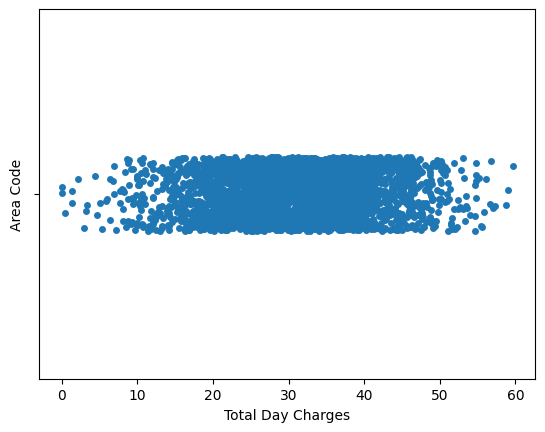

In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
# strip plot 
sns.stripplot(data=df, x="total day charge")

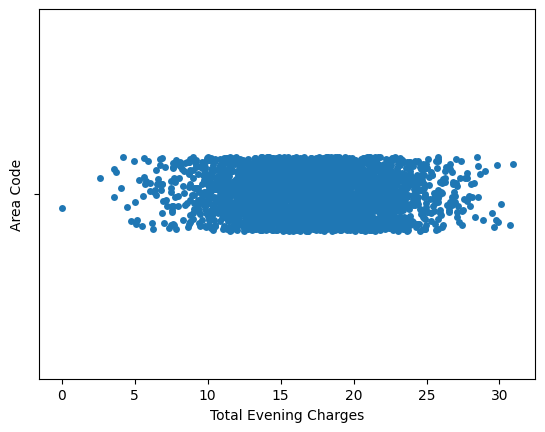

In [30]:
sns.stripplot(data=df, x="total eve charge")

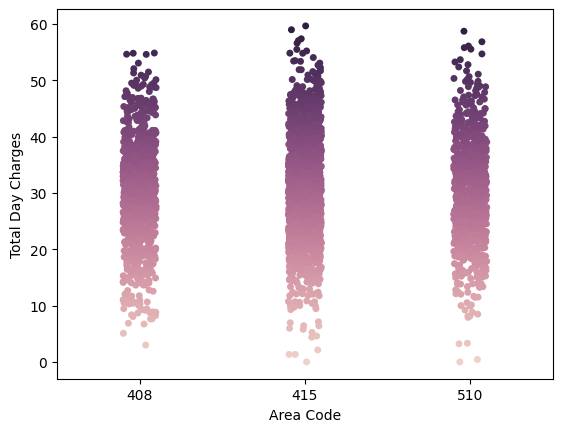

In [34]:
sns.stripplot(data=df, y="total day charge", x="area code",hue="total day charge", legend=False)

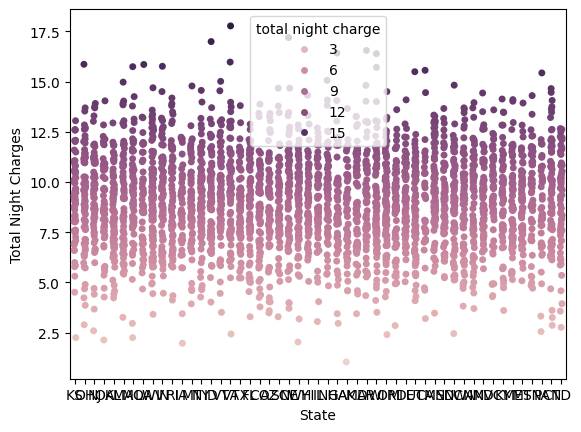

In [40]:
sns.stripplot(data=df, y="total night charge", x="state",hue="total night charge", legend=True)

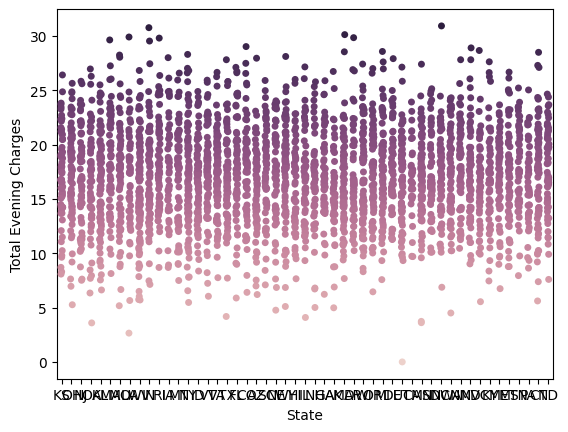

In [42]:
sns.stripplot(data=df, y="total eve charge", x="state",hue="total eve charge", legend=False)

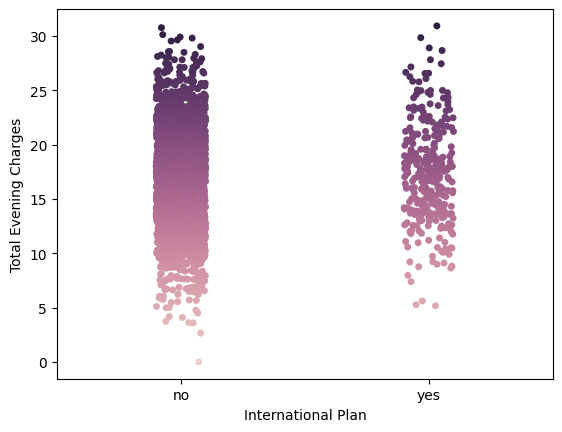

In [43]:
sns.stripplot(data=df, y="total eve charge", x="international plan",hue="total eve charge", legend=False)

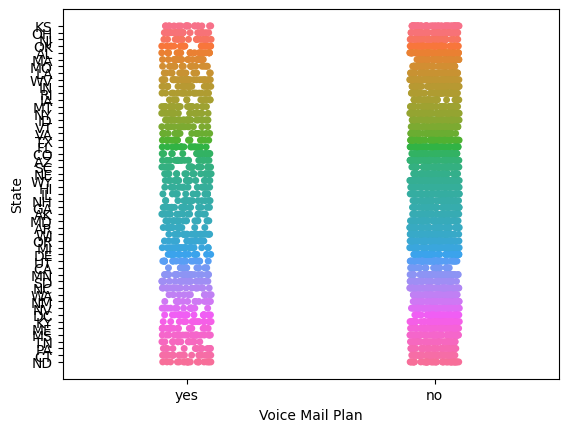

In [47]:
sns.stripplot(data=df, y="state", x="voice mail plan",hue="state", legend=False)

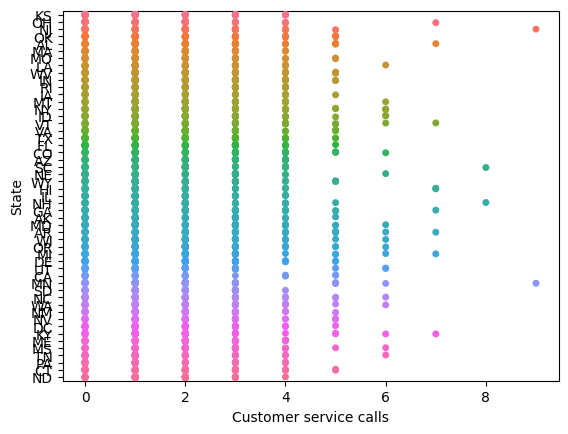

In [50]:
sns.stripplot(data=df, y="state", x="customer service calls",hue="state", legend=False)

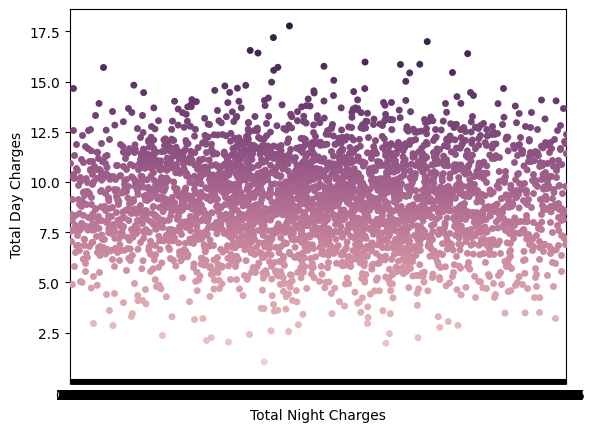

In [51]:
sns.stripplot(data=df, x="total day charge", y="total night charge", hue="total night charge", legend=False)

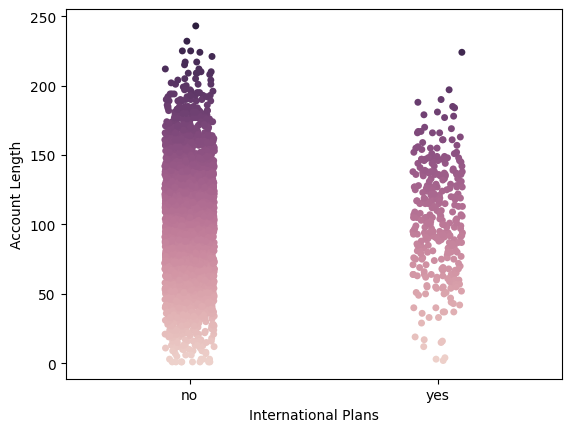

In [55]:
sns.stripplot(data=df, x="international plan", y="account length", hue="account length", legend=False)

<AxesSubplot: xlabel='area code', ylabel='total day charge'>

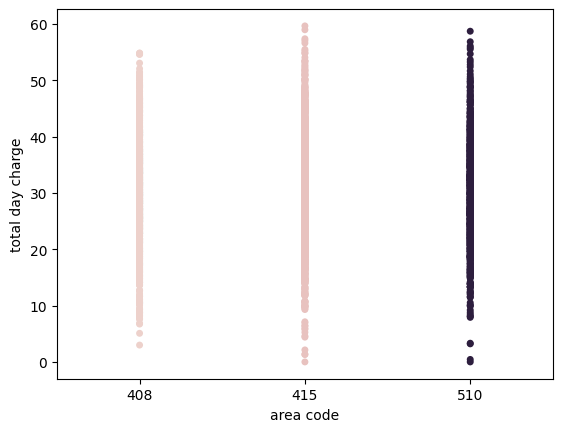

In [67]:
sns.stripplot(data=df, x="area code", y="total day charge",hue="area code", legend=False,jitter=False)

<AxesSubplot: xlabel='customer service calls', ylabel='total day charge'>

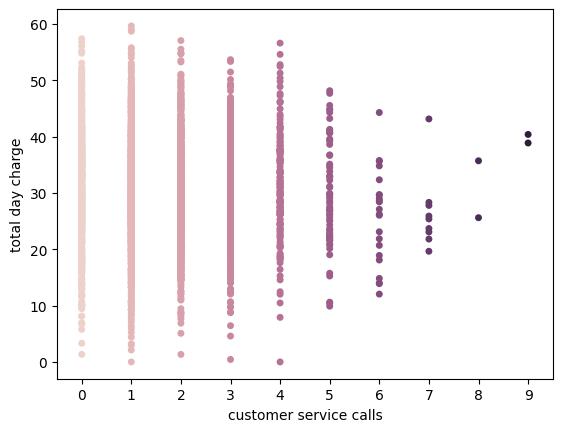

In [68]:
sns.stripplot(data=df, x="customer service calls", y="total day charge",hue="customer service calls", legend=False,jitter=False)

<AxesSubplot: xlabel='total day charge', ylabel='account length'>

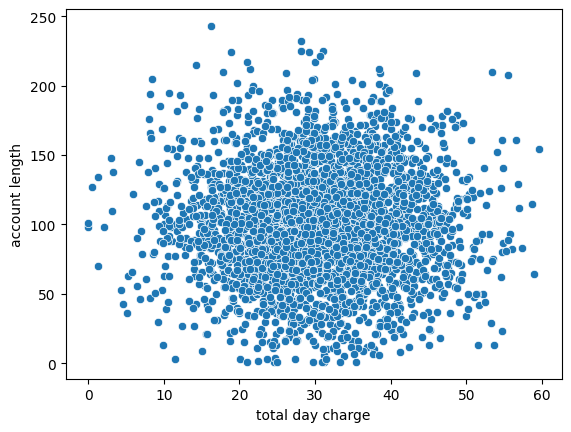

In [56]:
# scatterplot
sns.scatterplot(data=df, x="total day charge", y="account length")

<AxesSubplot: xlabel='total day charge', ylabel='state'>

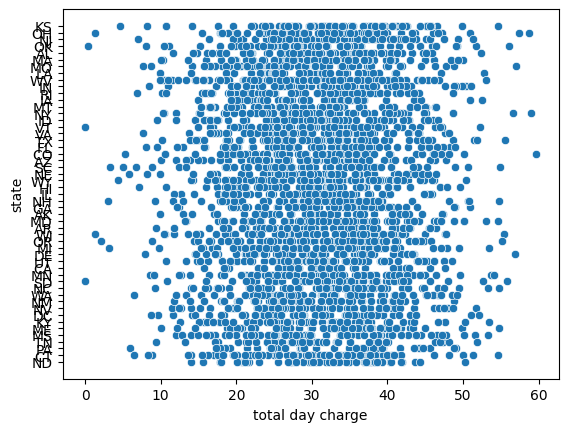

In [58]:
sns.scatterplot(data=df, x="total day charge", y="state")

<AxesSubplot: xlabel='total day charge', ylabel='total eve charge'>

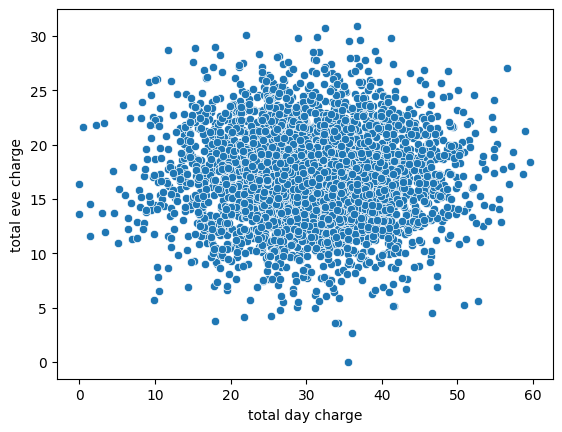

In [59]:
sns.scatterplot(data=df, x="total day charge", y="total eve charge")

<AxesSubplot: xlabel='total day charge', ylabel='total day calls'>

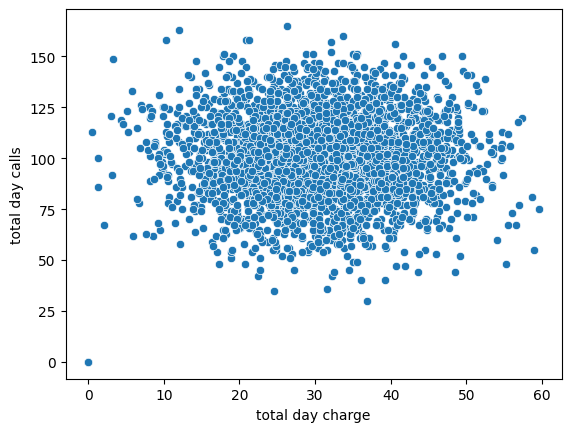

In [61]:
sns.scatterplot(data=df, x="total day charge", y="total day calls")

<AxesSubplot: xlabel='total day charge', ylabel='customer service calls'>

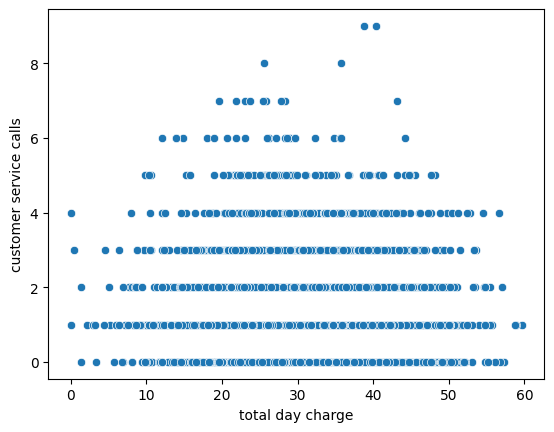

In [62]:
sns.scatterplot(data=df, x="total day charge", y="customer service calls")

<AxesSubplot: xlabel='area code', ylabel='total day charge'>

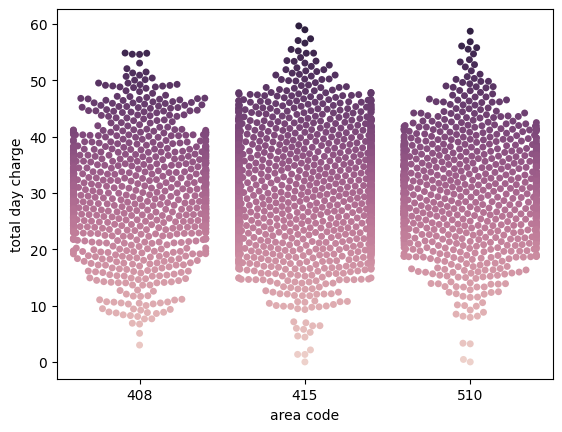

In [72]:
# swarmplot
sns.swarmplot(data=df, x="area code", y="total day charge",hue="total day charge", legend=False)

<AxesSubplot: xlabel='churn', ylabel='total intl charge'>

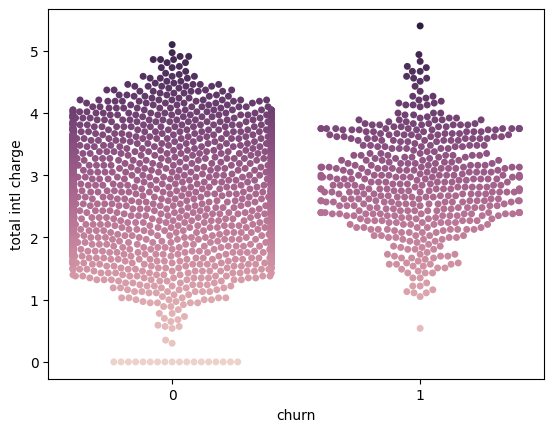

In [75]:
sns.swarmplot(data=df, x="churn", y="total intl charge",hue="total intl charge", legend=False)

<AxesSubplot: xlabel='churn', ylabel='total night charge'>

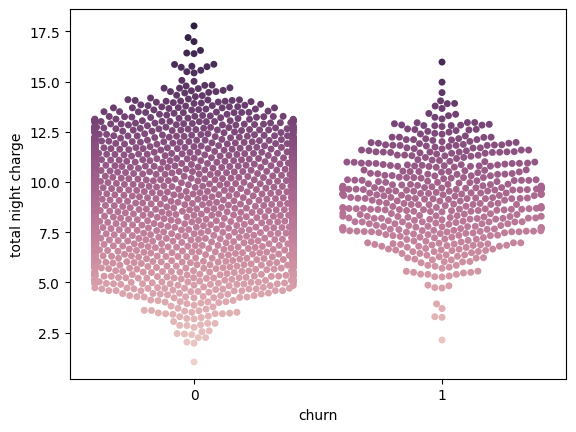

In [76]:
sns.swarmplot(data=df, x="churn", y="total night charge",hue="total night charge", legend=False)

<AxesSubplot: xlabel='churn', ylabel='total eve charge'>

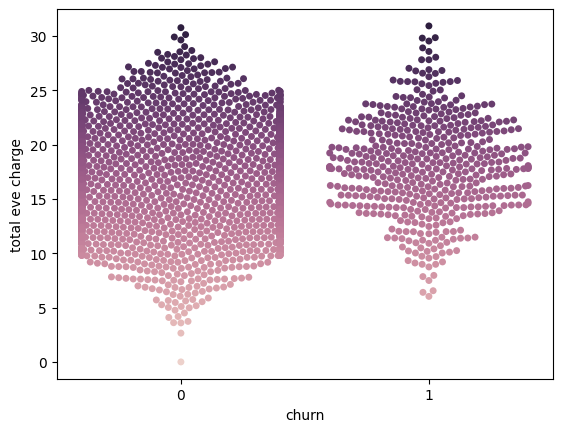

In [77]:
sns.swarmplot(data=df, x="churn", y="total eve charge",hue="total eve charge", legend=False)

<AxesSubplot: xlabel='churn', ylabel='total day charge'>

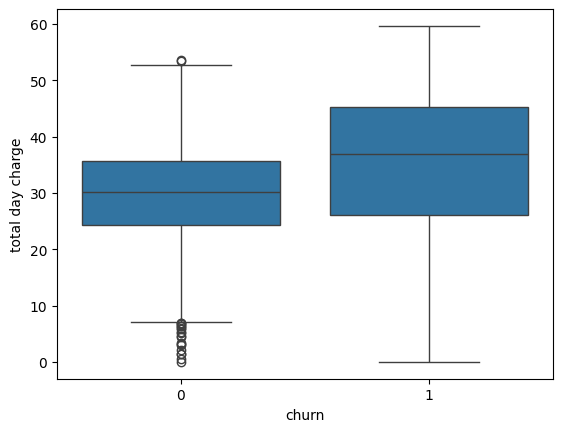

In [79]:
# boxplot
sns.boxplot(data=df,y='total day charge',x='churn')

<AxesSubplot: xlabel='churn', ylabel='total intl charge'>

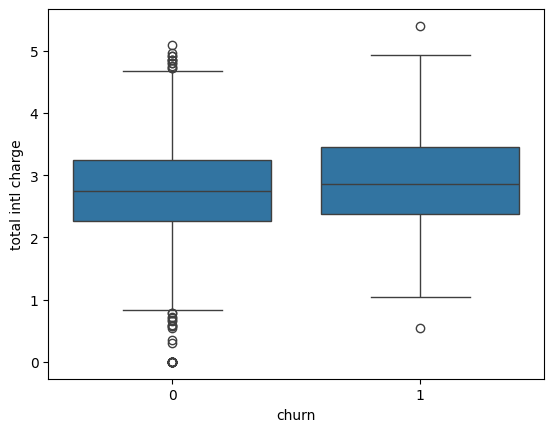

In [80]:
sns.boxplot(data=df,y='total intl charge',x='churn')

<AxesSubplot: xlabel='churn', ylabel='total day calls'>

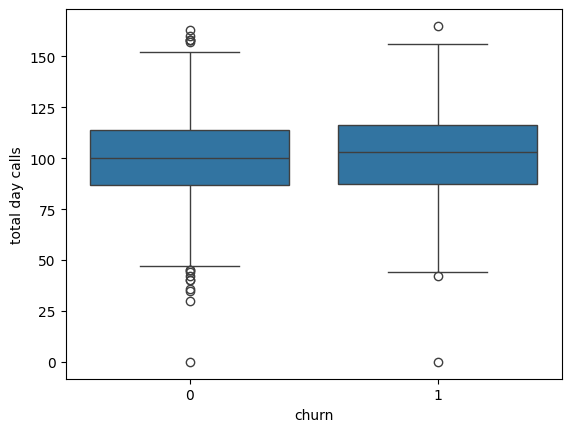

In [81]:
sns.boxplot(data=df,y='total day calls',x='churn')

<AxesSubplot: xlabel='churn', ylabel='total night calls'>

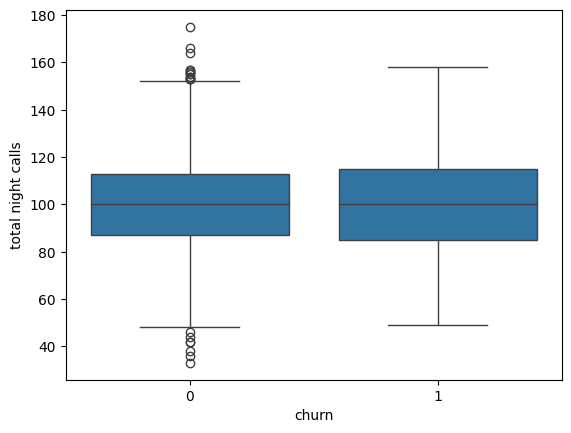

In [83]:
sns.boxplot(data=df,y='total night calls',x='churn')

<AxesSubplot: xlabel='state', ylabel='account length'>

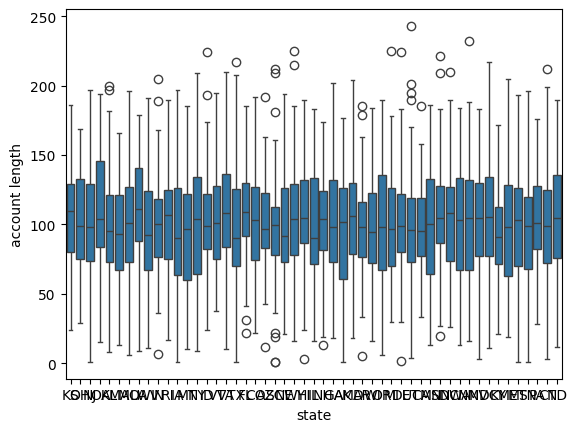

In [87]:
sns.boxplot(data=df,y='account length',x='state')

<AxesSubplot: ylabel='total day charge'>

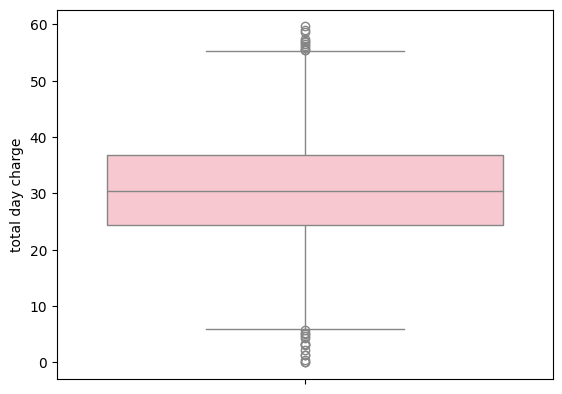

In [88]:
sns.boxplot(data=df,y='total day charge',color='pink')

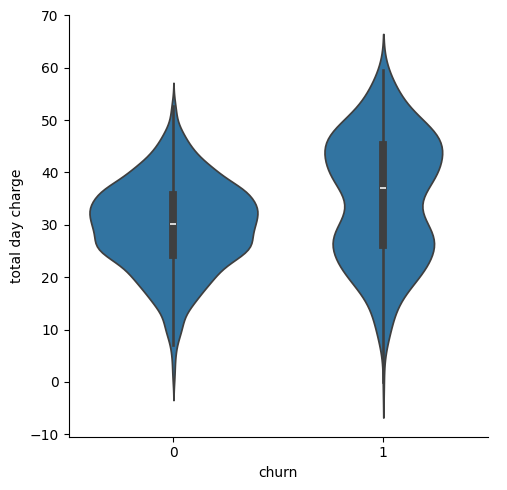

In [89]:
# catplot
sns.catplot(data=df,x='churn',y='total day charge',kind='violin')

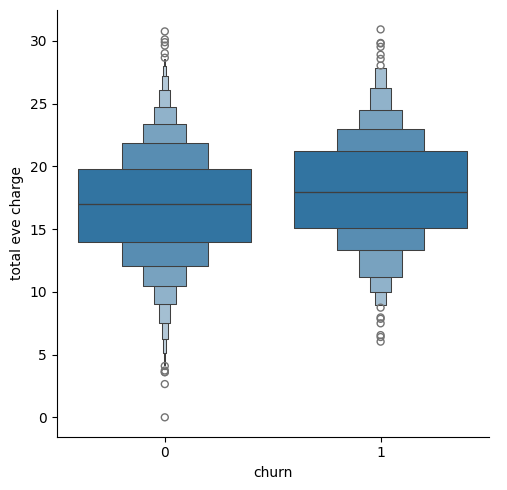

In [91]:
sns.catplot(data=df,x='churn',y='total eve charge',kind='boxen')

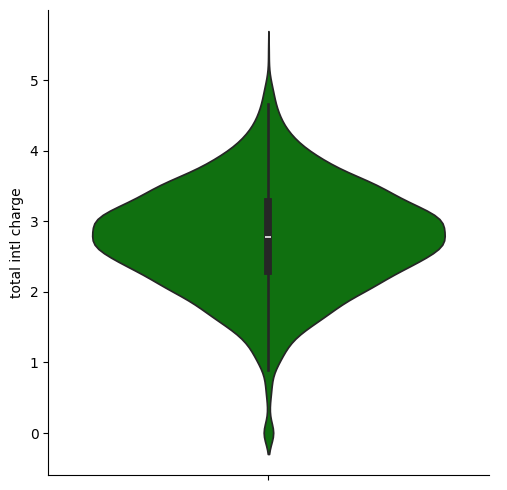

In [93]:
sns.catplot(data=df,y='total intl charge',kind='violin',color='green')

<AxesSubplot: xlabel='churn', ylabel='total day calls'>

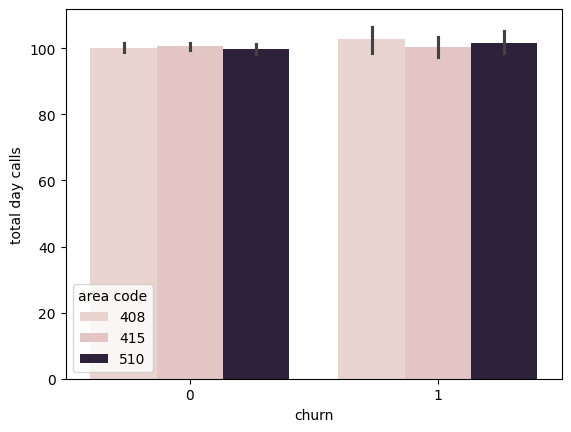

In [95]:
# barplot
sns.barplot(data=df,x='churn',y='total day calls',hue='area code')

<AxesSubplot: xlabel='churn', ylabel='total day calls'>

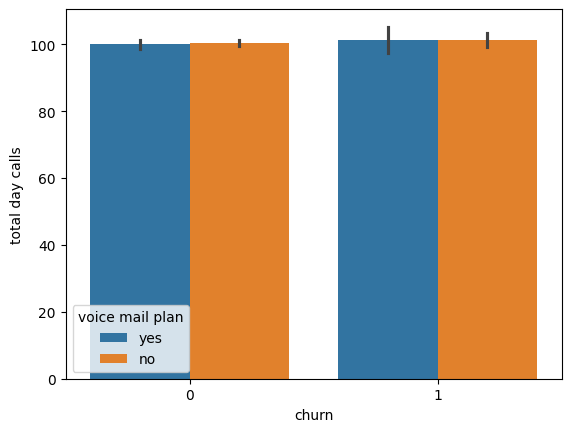

In [97]:
sns.barplot(data=df,x='churn',y='total day calls',hue='voice mail plan')

<AxesSubplot: xlabel='churn', ylabel='customer service calls'>

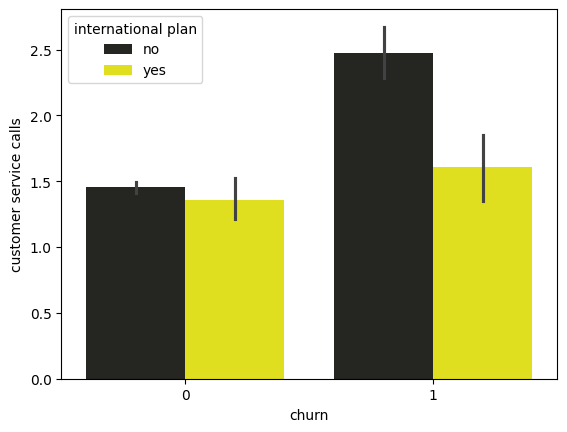

In [98]:
sns.barplot(data=df,x='churn',y='customer service calls',hue='international plan',color="yellow")

<AxesSubplot: xlabel='churn', ylabel='number vmail messages'>

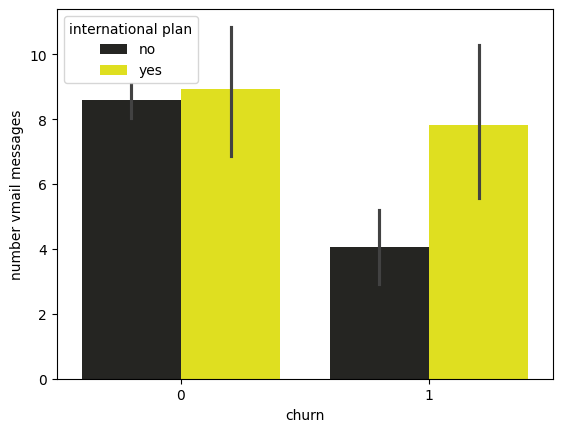

In [100]:
sns.barplot(data=df,x='churn',y='number vmail messages',hue='international plan',color="yellow")

<AxesSubplot: xlabel='customer service calls', ylabel='count'>

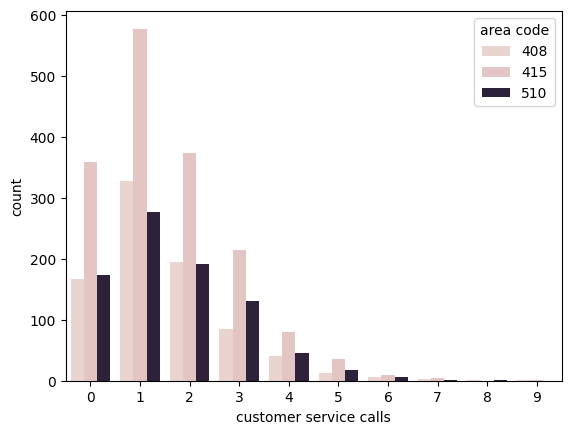

In [101]:
# countplot
sns.countplot(data=df,x='customer service calls',hue='area code')

<AxesSubplot: xlabel='churn', ylabel='count'>

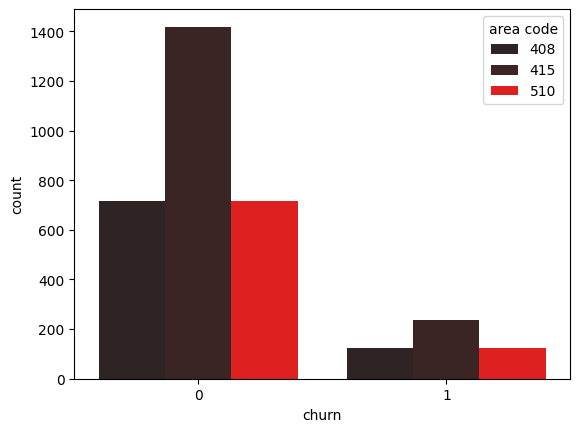

In [103]:
sns.countplot(data=df,x='churn',hue='area code',color="red")

<AxesSubplot: xlabel='voice mail plan', ylabel='count'>

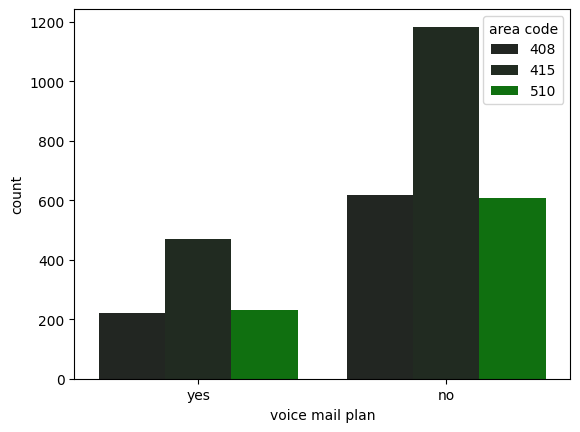

In [104]:
sns.countplot(data=df,x='voice mail plan',hue='area code',color="green")

<AxesSubplot: xlabel='churn', ylabel='count'>

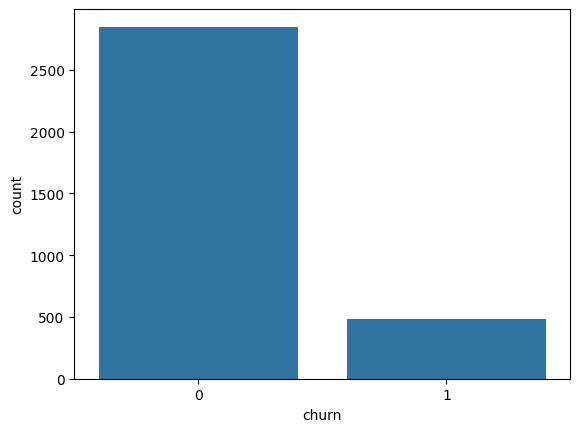

In [105]:
sns.countplot(data=df,x='churn')

<AxesSubplot: xlabel='international plan', ylabel='count'>

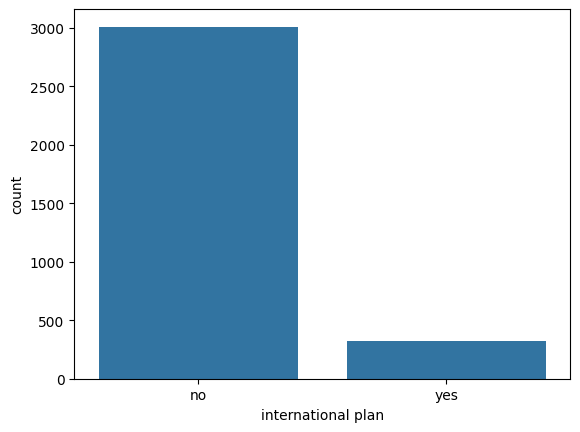

In [106]:
sns.countplot(data=df,x='international plan')

<AxesSubplot: xlabel='voice mail plan', ylabel='count'>

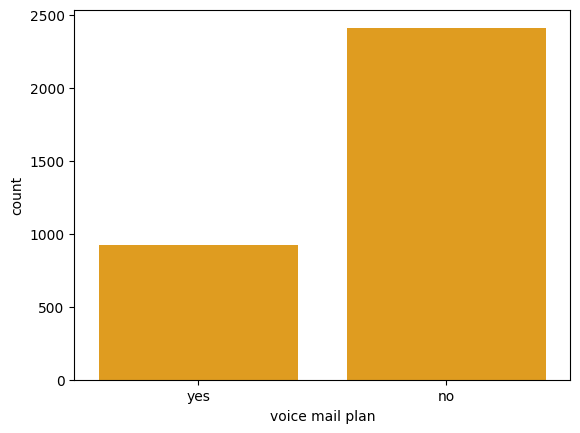

In [107]:
sns.countplot(data=df,x='voice mail plan', color="orange")

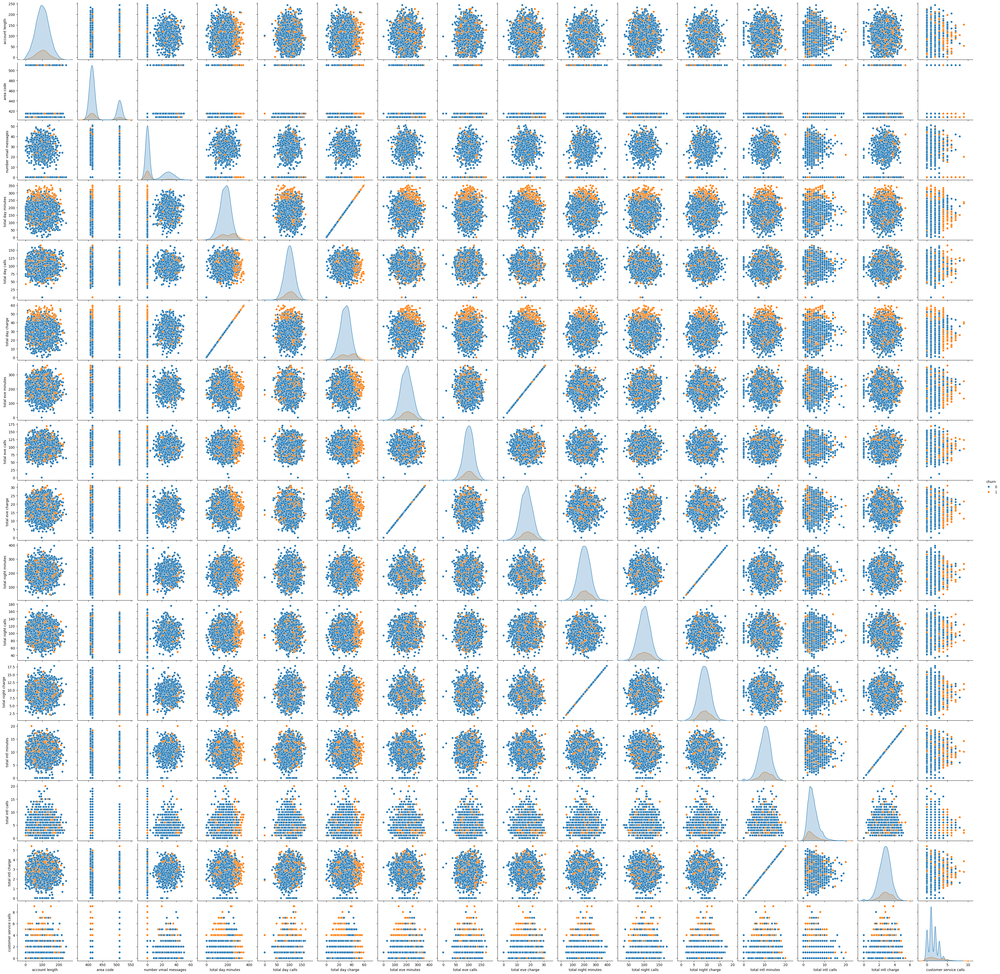

In [112]:
sns.pairplot(data=df,hue='churn')

<AxesSubplot: xlabel='international plan', ylabel='Count'>

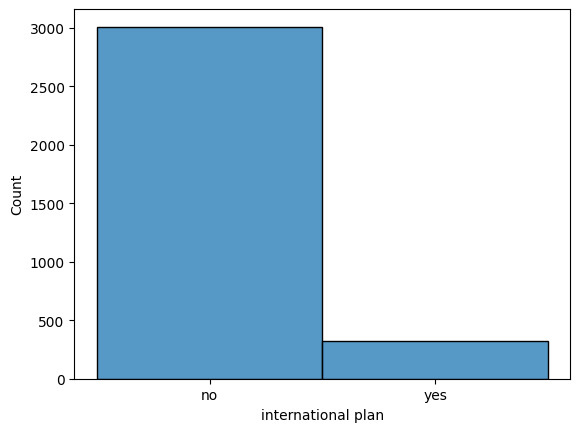

In [113]:
# histogram
sns.histplot(data=df,x='international plan')

<AxesSubplot: xlabel='account length', ylabel='Count'>

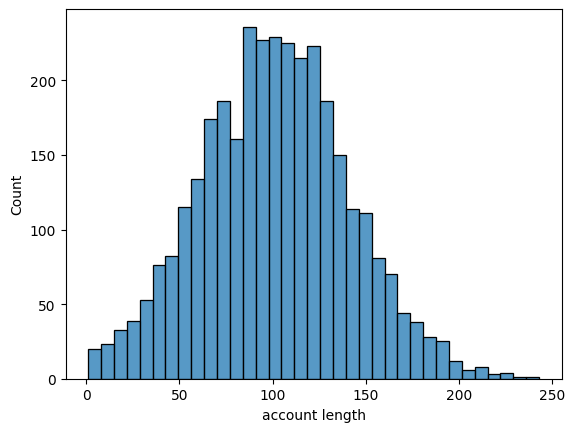

In [115]:
sns.histplot(data=df,x='account length')

<AxesSubplot: xlabel='total day charge', ylabel='Count'>

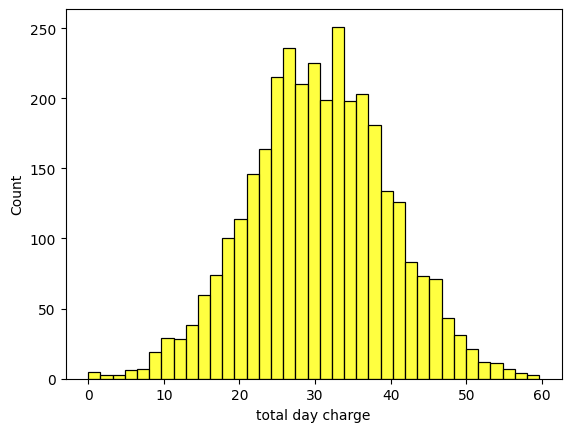

In [118]:
sns.histplot(data=df,x='total day charge',color="yellow")

<AxesSubplot: xlabel='number vmail messages', ylabel='Count'>

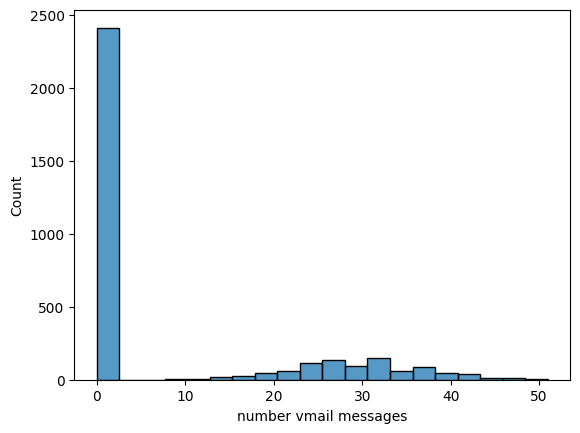

In [120]:
sns.histplot(data=df,x='number vmail messages')

<AxesSubplot: xlabel='international plan', ylabel='total intl minutes'>

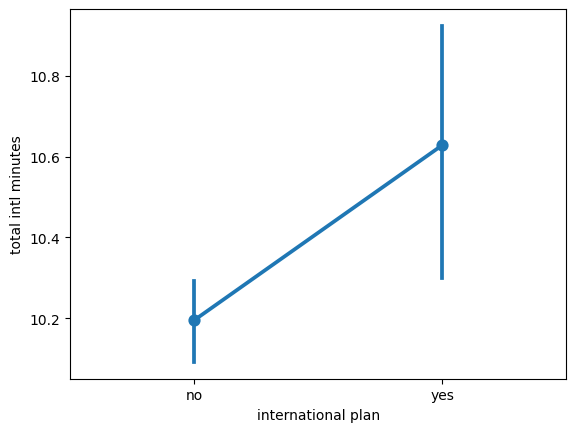

In [128]:
# pointplot
sns.pointplot(data=df, x='international plan', y='total intl minutes')

<AxesSubplot: xlabel='area code', ylabel='total intl minutes'>

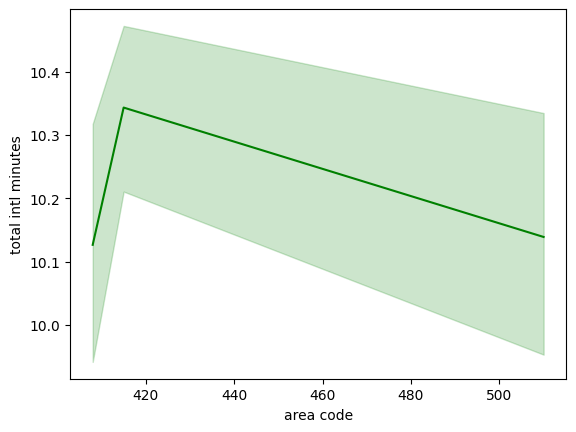

In [139]:
sns.lineplot(data=df, x='area code' ,y='total intl minutes',color="green")

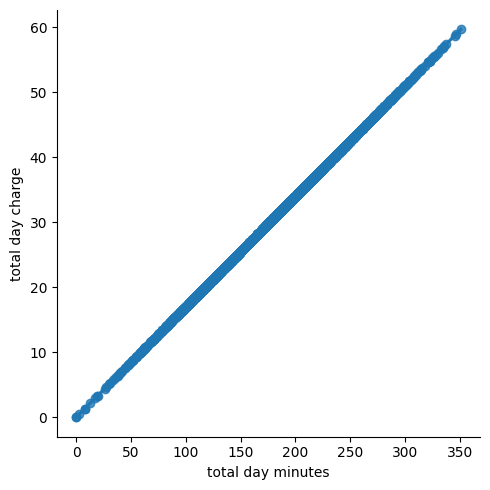

In [144]:
sns.lmplot(data=df, x='total day minutes',y='total day charge')